In [1]:
import sisl
import sisl.viz
import numpy as np
from pathlib import Path
import os

In [2]:
#Generar molecula i geom.fdf
from ase.build import molecule
benzene = molecule("C6H6",5)
geometry = sisl.Geometry.new(benzene)
#Crear carpeta inputs i escriure arxius de geometria i RUN.fdf a carpeta input (Cal afegir .psf manualment)
input = Path("inputs")
input.mkdir(exist_ok=True)
geometry.write(input / "geom.fdf")
#Plot estructura
geometry.plot(axes="xy")
#Crear RUN.fdf 
with open(input/'RUN.fdf','w') as f: #Crear i escriure RUN.fdf
    f.write('%include geom.fdf \n')
    f.write('TS.HS.Save true')
#Executar SIESTA
output = Path("output")
output.mkdir(exist_ok=True)

os.system(f"cp {input}/* {output}")

siesta_path = "/opt/anaconda3/envs/nanociencia/bin/siesta" #...escriu aquí la ruta de siesta
os.system(f"cd {output}; {siesta_path} RUN.fdf > RUN.out")

Job completed


0

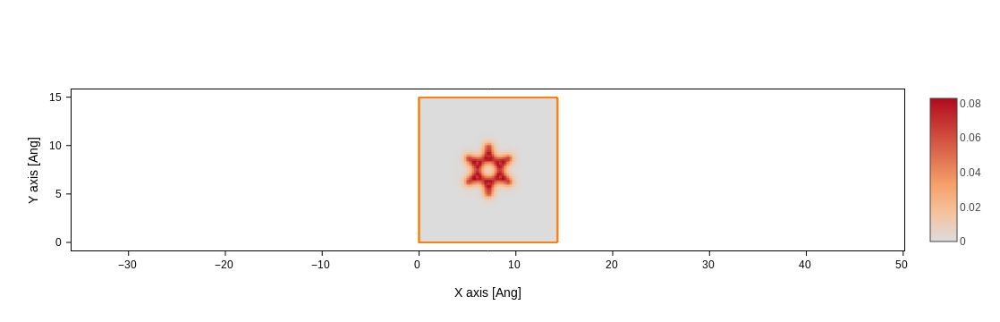

In [12]:
#Llegir Hamilt i geometria SIESTA
H = sisl.get_sile(output/"RUN.fdf").read_hamiltonian()
geom = sisl.get_sile(output/"RUN.fdf").read_geometry()
def LDOS_grid(H, V):
    grid = sisl.Grid((100, 100, 100), geometry=geom) #Grid final
    eigenstate = H.eigenstate() #Obtenir els estats de l'Hamiltonià
    grid_buc = sisl.Grid((100, 100, 100), geometry = geom) #Grid utilitzat per a emmagatzemar temporalment cada DP individualment per a sumarla al grid final
    if V > 0: #Cas V>0 (Integral de 0 a V)
        for eig in eigenstate:
            if eig.eig <= V and eig.eig > 0:#Per a tots els estats en que la seva energia sigui menor a V i major que 0
                grid_buc.fill(0) #Reiniciar grid temporal
                wavefunc = eig.wavefunction(grid_buc)
                DP = grid_buc * grid_buc #Calcular densitat de probabilitat
                grid = grid + DP
    elif V < 0: #Cas V<0 (Integral de V a 0)
        for eig in eigenstate:
            if eig.eig >= V and eig.eig < 0:#Per a tots els estats en que la seva energia sigui major a V i menor que 0 
                grid_buc.fill(0) #Reiniciar grid temporal
                wavefunc = eig.wavefunction(grid_buc)
                DP = grid_buc * grid_buc #Calcular densitat de probabilitat
                grid = grid + DP        
    return grid
LDOS_grid(H,-10).plot(axes="xy")

In [5]:
# The helper function
def plot_STM_images(
    LDOS_grid: sisl.Grid, 
    min_height: int = 0, 
    max_height: int = 2,
    steps: int = 9,
    crange = None,
    colorscale: str = None
):
    """Plots constant height STM images at multiple heights

    Parameters
    ----------
    LDOS_grid:
        A grid containing the LDOS corresponding to the voltage that you
        want to plot, for ALL SPACE.
    min_height:
        The height of the first image.
    max_height:
        The height of the last image.
    steps:
        The number of steps between the first and the last image.
    log:
        Whether to plot the log of the values.
    crange:
        The range of the colorscale. E.g. [0, 2]. If None, it is computed
        from the minimum and maximum values of the data.
    colorscale:
        The plotly colorscale to use.

    Examples
    ----------

    This function should be used like:
    >>> grid = ...compute the LDOS in the grid.
    >>> plot_STM_images(grid)
    """

    # Determine all the heights that the user wants to plot
    heights = np.linspace(min_height, max_height, steps)
    # Get the position of the benzene molecule
    z_0 = LDOS_grid.geometry.xyz[:, 2].max()
    
    # Initialize a list of plots
    plots = []
    coloraxes = []
    # Loop through the heights, and for each of them we will create a plot.
    for height in heights:
        # Get the z for which we want the LDOS (benzene position + height)
        z = z_0 + height
        
        # Get the plot for this height
        plot = LDOS_grid.plot(axes="xy", z_range=[z - 0.1, z + 0.1], crange=crange, colorscale=colorscale)

        # And append it to the list
        plots.append(plot)

    # Merge all the plots, with some extra arguments to beautify the plot.
    return sisl.viz.merge_plots(
        *plots, 
        composite_method="subplots", 
        arrange="square", 
        subplot_titles=[f"Height = {height} Ang" for height in heights],
        horizontal_spacing=0,
        vertical_spacing=0.05
    ).update_xaxes(
        visible=False
    ).update_yaxes(
        visible=False
    ).update_layout(
        height=900, title=f"Constant height STM images",
    )

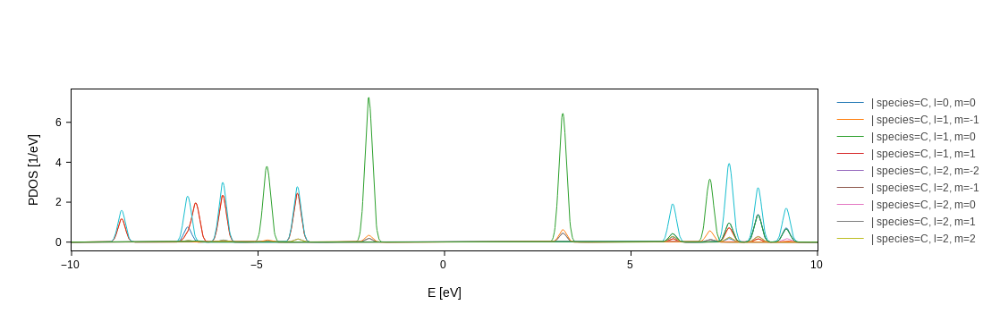

In [6]:
H.plot.pdos(data_Erange=[-10, 10], nE=1200, Erange=[-10, 10], kgrid=[1,1,1]).split_DOS(on="species+l+m")

**-10V:** ens permet veure la suma de tots els orbitals s i p antienllaçant del C i H

**-1.8V:** no ens permet veure res ja que no hi han estats possibles.

**4V:** ens permet veure els orbitals s del C.

**7V:** ens permet veure la suma de dels orbitals s i p del C i H enllaçants, però al augmentar l'alçada només podem observar els del C degut a que la resta de intensitats són molt menors i perden importancia en augmentar l'alçada

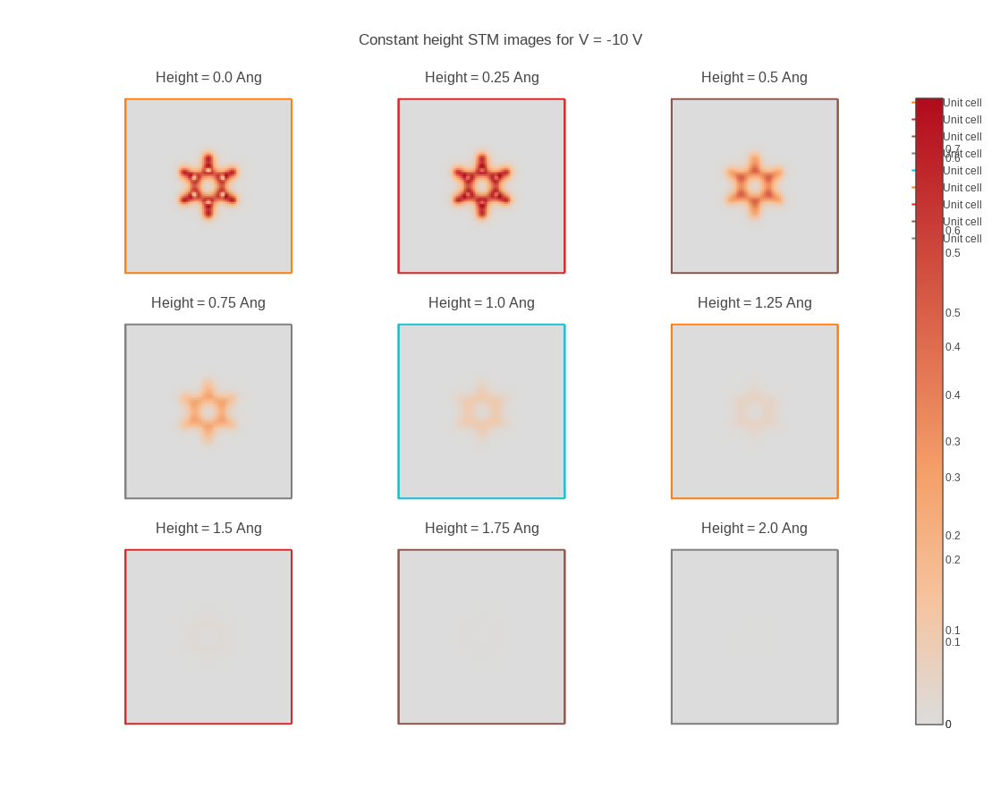

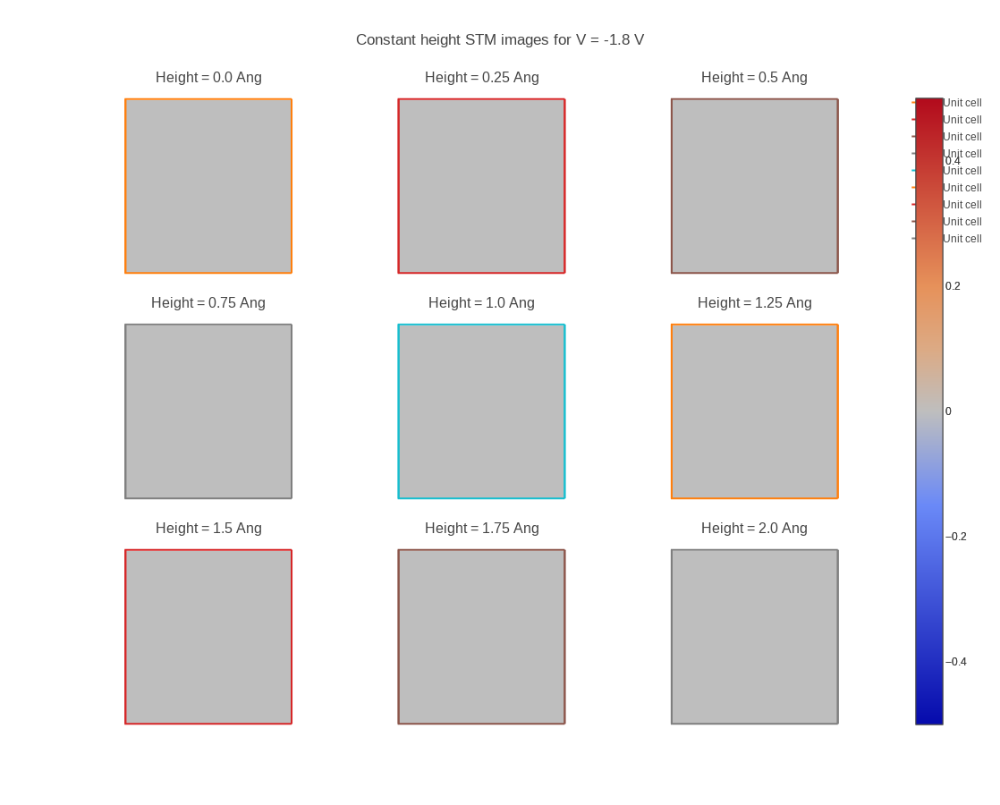

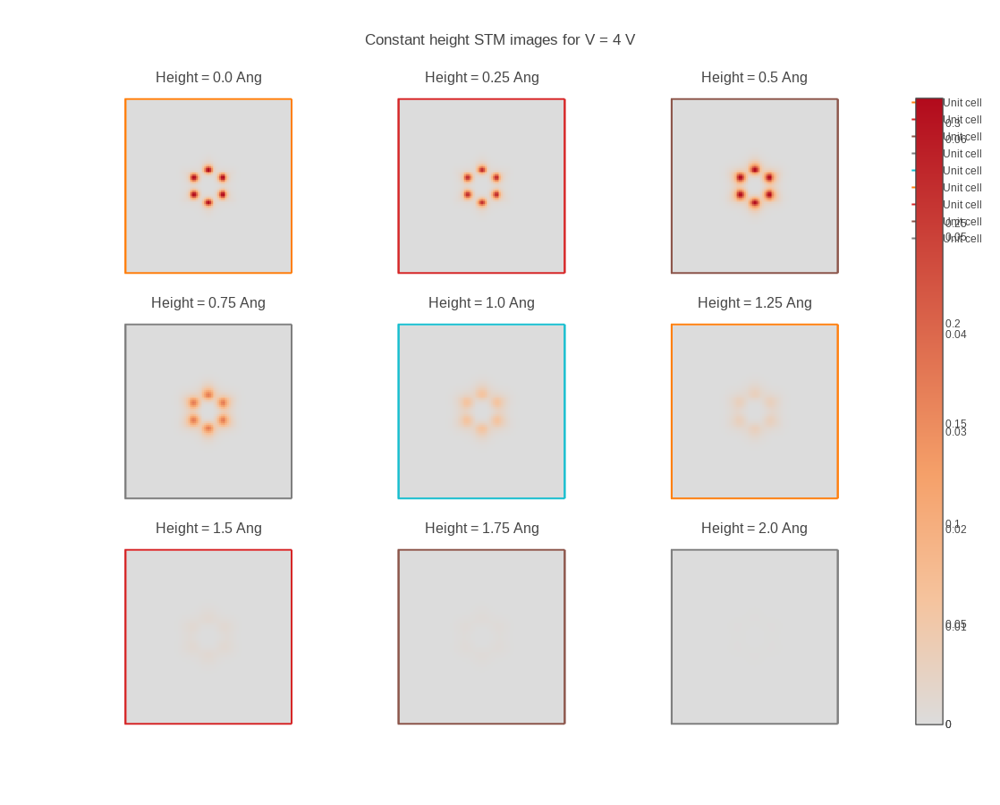

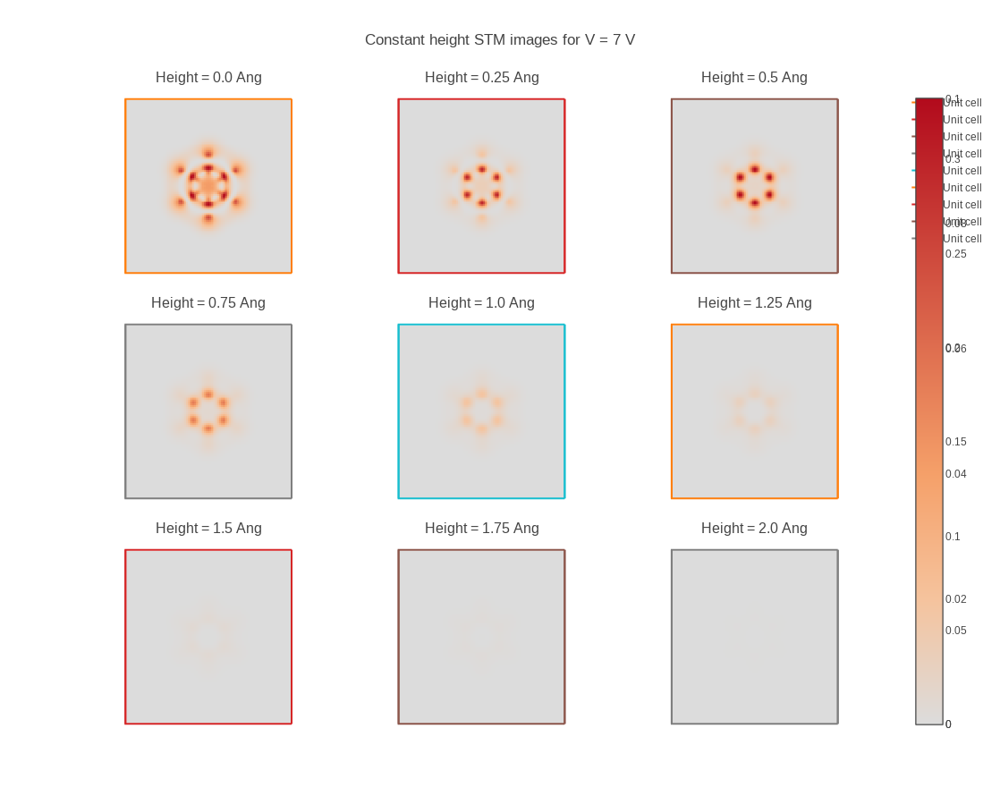

In [41]:
V = [-10,-1.8,4,7] #Llista de valors de V  
for i in V:#Per cada valor de V
    #Representar imatge STM
    plot_STM_images(LDOS_grid(H,i)).update_layout(title ="Constant height STM images for V = " + str(i)+" V").show() #.show() per a que ensenyi cada imatge per separat
    


**BONUS**

Volem veure els pics en el rang de 5.5 a 6.5 eV, per a fer-ho, farem una imatge STM aplicant -6.5V i una altre aplicant -5.5V i restarem les intensitats.

En aquest cas podrem observar els orbitals s antienllaçants de l'H.

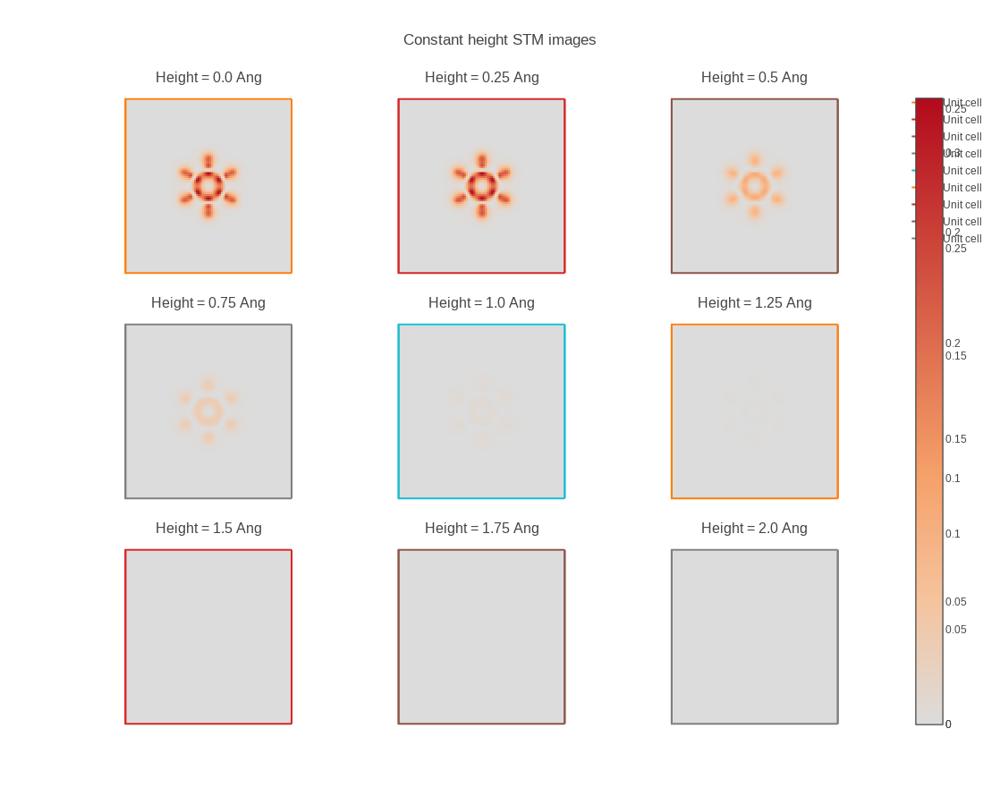

In [39]:
plot_STM_images(LDOS_grid(H,-6.5)-LDOS_grid(H,-5.5))